### Notebook Overview

Section 1: [Data Loading and Preparation](#data-loading-and-preparation)

Section 2: [Data Distribution Visualization](#data-distribution-visualization)

Section 3: [Feature Selection & Encoding](#feature-selection-and-encoding)

Section 4: [Model Training and Evaluation](#model-training-and-evaluation)

Section 5: [Model Evaluation](#model-evaluation)

Section 6: [Testing with Potential Customers Dataset](#testing-with-potential-customers-dataset)

Section 7: [Potential Customer Analysis](#potential-customer-analysis)
---

In [12]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
import scipy.stats as stats
import plotly.subplots as sp
import statsmodels.api as sm
from plotly.subplots import make_subplots
from sklearn.linear_model import LinearRegression, Ridge, Lasso, HuberRegressor, RANSACRegressor
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.model_selection import StratifiedKFold, train_test_split
from category_encoders import OneHotEncoder
import plotly.figure_factory as ff
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV

import warnings
warnings.filterwarnings('ignore')

np.random.seed(42)

<a id="data-loading-and-preparation"></a>
### Data Loading and Preparation

In [13]:
data = pd.read_csv('customers_df.csv')
df = data.copy()

potential_customers = pd.read_csv('potential_customers_df.csv')
poten_df = potential_customers.copy()

In [14]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9637 entries, 0 to 9636
Data columns (total 32 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   id                       9637 non-null   float64
 1   store_category           9637 non-null   object 
 2   store_sub_category       9637 non-null   object 
 3   description              9637 non-null   object 
 4   city                     9637 non-null   object 
 5   latitude                 9637 non-null   float64
 6   longitude                9637 non-null   float64
 7   distance                 9637 non-null   float64
 8   distance_to_city_center  9637 non-null   float64
 9   store_size               9637 non-null   float64
 10  opening_hour             9637 non-null   float64
 11  closing_hour             9637 non-null   float64
 12  opening_duration         9637 non-null   float64
 13  date_opening             9637 non-null   object 
 14  opening_timeofday       

In [15]:
df['date_opening'] = pd.to_datetime(df['date_opening'])

<a id="data-distribution-visualization"></a>
### Data Distribution Visualization

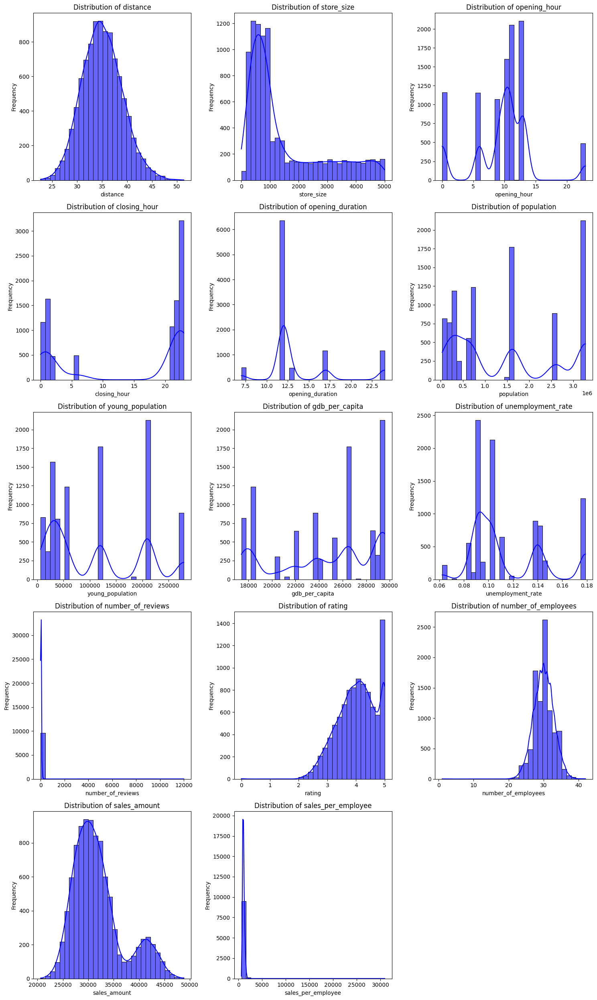

In [16]:
col_to_check = df[['distance', 'store_size', 'opening_hour', 'closing_hour', 'opening_duration',
                   'population', 'young_population', 'gdb_per_capita', 'unemployment_rate',
                   'number_of_reviews', 'rating', 'number_of_employees', 'sales_amount', 'sales_per_employee']]

num_plots = len(col_to_check.columns)
num_cols = 3
num_rows = (num_plots // num_cols) + (num_plots % num_cols > 0)

plt.figure(figsize=(15, 5 * num_rows))

for index, column in enumerate(col_to_check.columns):
    plt.subplot(num_rows, num_cols, index + 1)
    sns.histplot(col_to_check[column], kde=True, color="blue", bins=30, alpha=0.6, edgecolor='black')
    plt.title(f'Distribution of {column}')
    plt.xlabel(column)
    plt.ylabel('Frequency')

plt.tight_layout()
plt.show()

In [17]:
# col_to_check check box plot using plotly
fig = make_subplots(rows=num_rows, cols=num_cols, subplot_titles=col_to_check.columns)

for index, column in enumerate(col_to_check.columns):
    fig.add_trace(go.Box(y=col_to_check[column], name=column), row=(index // num_cols) + 1, col=(index % num_cols) + 1)

fig.update_layout(height=1000, width=1000, title_text="Box plot of columns")
fig.show()

#### correlation matrix

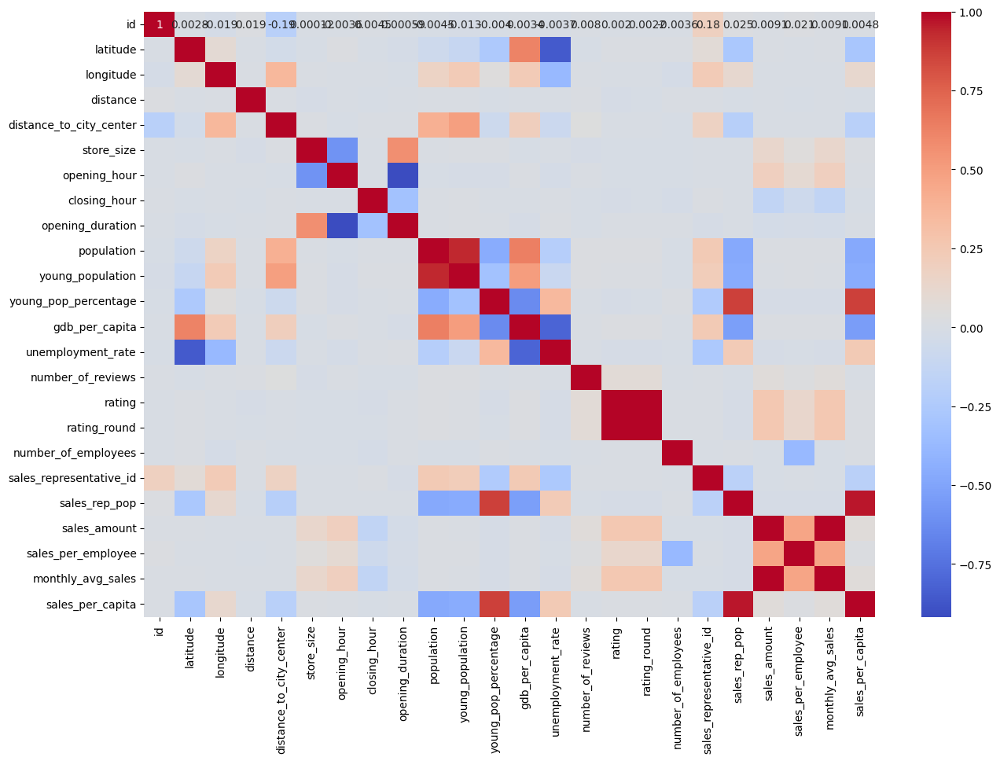

In [18]:
numerical_columns = df.select_dtypes(include=np.number).columns

corr_matrix = df[numerical_columns].corr()

plt.figure(figsize=(15, 10))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm')
plt.show()

#### Drop extreme outliers

In [19]:
df.drop(df[df['number_of_reviews'] == 12000].index, inplace=True)
df.drop(df[df['number_of_reviews'] == 9000].index, inplace=True)

In [20]:
df.drop(df[df['sales_amount'] < 0].index, inplace=True)

<a id="model-training-and-evaluation"></a>
### Model Training and Evaluation

#### Select the feature

In [21]:
df.columns

Index(['id', 'store_category', 'store_sub_category', 'description', 'city',
       'latitude', 'longitude', 'distance', 'distance_to_city_center',
       'store_size', 'opening_hour', 'closing_hour', 'opening_duration',
       'date_opening', 'opening_timeofday', 'closing_timeofday', 'parking',
       'population', 'young_population', 'young_pop_percentage',
       'gdb_per_capita', 'unemployment_rate', 'number_of_reviews', 'rating',
       'rating_round', 'number_of_employees', 'sales_representative_id',
       'sales_rep_pop', 'sales_amount', 'sales_per_employee',
       'monthly_avg_sales', 'sales_per_capita'],
      dtype='object')

In [22]:
initial_features = ['store_category', 'store_sub_category','city', 'distance', 'opening_hour', 'closing_hour', 
                    'distance_to_city_center', 'store_size', 'opening_duration', 'population', 'young_population','young_pop_percentage', 'gdb_per_capita', 'unemployment_rate',
                    'number_of_reviews','rating', 'number_of_employees',
                    'sales_amount']

df = df[initial_features]

initial_features_test = ['store_category', 'store_sub_category','city', 'distance', 'opening_hour', 'closing_hour', 
                    'distance_to_city_center', 'store_size', 'opening_duration', 'population', 'young_population','young_pop_percentage', 'gdb_per_capita', 'unemployment_rate',
                    'number_of_reviews','rating', 'number_of_employees']

poten_df = poten_df[initial_features_test]

#### One-hot encoding

In [23]:
categorical_columns = df.select_dtypes(include=['object']).columns

df = pd.get_dummies(df, columns=categorical_columns, drop_first=True)

In [24]:
print(df.shape)

(9635, 52)


#### Drop target variable

In [25]:
df = df.applymap(lambda x: 1 if x is True else (0 if x is False else x))
poten_df = poten_df.applymap(lambda x: 1 if x is True else (0 if x is False else x))

In [26]:
# Target variable
X = df.drop('sales_amount', axis=1)
y = df['sales_amount']

#### Split the data

In [27]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2,random_state=42)

#### Using AIC & BIC to see how well a model fits the data while penalizing for complexity 

In [28]:
def calculate_aic_bic(model):
    aic = model.aic
    bic = model.bic
    return aic, bic

#### Forward feature selection

a step by step process to find the best feature for the model 

we start with no feature -> + feature one by one -> evaluate the performance -> repeat

In [31]:
def forward_selection(X_train, y_train, criterion='AIC'):
    initial_features = [] 
    best_features = []
    remaining_features = list(X_train.columns)
    best_criterion_value = np.inf

    while remaining_features:
        criterion_values = []
        for feature in remaining_features:
            current_features = initial_features + [feature]
            X_combo = sm.add_constant(X_train[current_features])
            model = sm.OLS(y_train, X_combo).fit()
            aic, bic = calculate_aic_bic(model)
            criterion_value = aic if criterion == 'AIC' else bic
            criterion_values.append((criterion_value, feature))

        criterion_values.sort()
        best_new_criterion_value, best_new_feature = criterion_values[0]

        if best_new_criterion_value < best_criterion_value:
            initial_features.append(best_new_feature)
            best_criterion_value = best_new_criterion_value
            best_features = list(initial_features)
            remaining_features.remove(best_new_feature)
        else:
            break

    return best_features


#### Find the best feature

In [32]:
best_features_aic = forward_selection(X_train, y_train, criterion='AIC')
best_features_bic = forward_selection(X_train, y_train, criterion='BIC')

print("Best features AIC:", best_features_aic)
print("Best features BIC:", best_features_bic)

Best features AIC: ['store_category_restaurant', 'store_category_hotel', 'number_of_reviews', 'store_sub_category_pub', 'rating', 'store_sub_category_sport bar', 'opening_hour', 'opening_duration', 'closing_hour', 'store_size', 'city_burgos', 'city_valladolid', 'city_madrid', 'distance']
Best features BIC: ['store_category_restaurant', 'store_category_hotel', 'number_of_reviews', 'store_sub_category_pub', 'rating', 'store_sub_category_sport bar', 'opening_hour', 'opening_duration', 'closing_hour', 'store_size']


<a id="model-evaluation"></a>
### Linear regression (OLS)

Baseline OLS Model with AIC selected features

In [33]:
# Baseline OLS Model with AIC selected features
X_train_best_aic = sm.add_constant(X_train[best_features_aic])
X_test_best_aic = sm.add_constant(X_test[best_features_aic])
model_aic = sm.OLS(y_train, X_train_best_aic).fit()
y_pred_aic = model_aic.predict(X_test_best_aic)
mse_aic = mean_squared_error(y_test, y_pred_aic)
r2_aic = r2_score(y_test, y_pred_aic)

print("AIC Model summary:")
print(model_aic.summary())
print(f"AIC Model - MSE: {mse_aic}, R2: {r2_aic}")

AIC Model summary:
                            OLS Regression Results                            
Dep. Variable:           sales_amount   R-squared:                       0.826
Model:                            OLS   Adj. R-squared:                  0.826
Method:                 Least Squares   F-statistic:                     2610.
Date:                Tue, 09 Jul 2024   Prob (F-statistic):               0.00
Time:                        21:20:04   Log-Likelihood:                -69864.
No. Observations:                7708   AIC:                         1.398e+05
Df Residuals:                    7693   BIC:                         1.399e+05
Df Model:                          14                                         
Covariance Type:            nonrobust                                         
                                   coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------

Baseline OLS Model with BIC selected features

In [34]:
# Baseline OLS Model with BIC selected features
X_train_best_bic = sm.add_constant(X_train[best_features_bic])
X_test_best_bic = sm.add_constant(X_test[best_features_bic])
model_bic = sm.OLS(y_train, X_train_best_bic).fit()
y_pred_bic = model_bic.predict(X_test_best_bic)
mse_bic = mean_squared_error(y_test, y_pred_bic)
r2_bic = r2_score(y_test, y_pred_bic)

print("BIC Model summary:")
print(model_bic.summary())
print(f"BIC Model - MSE: {mse_bic}, R2: {r2_bic}")

BIC Model summary:
                            OLS Regression Results                            
Dep. Variable:           sales_amount   R-squared:                       0.826
Model:                            OLS   Adj. R-squared:                  0.826
Method:                 Least Squares   F-statistic:                     3647.
Date:                Tue, 09 Jul 2024   Prob (F-statistic):               0.00
Time:                        21:20:04   Log-Likelihood:                -69873.
No. Observations:                7708   AIC:                         1.398e+05
Df Residuals:                    7697   BIC:                         1.398e+05
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                                   coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------

Choose the best linear regression model (AIC or BIC)

In [35]:
best_model = model_aic if mse_aic < mse_bic else model_bic
best_features = best_features_aic if mse_aic < mse_bic else best_features_bic

Look at the model coefficients

In [36]:
model_coefficients = pd.DataFrame(best_model.params, columns=['Coefficient'])
model_coefficients['P-value'] = best_model.pvalues
model_coefficients['Significance'] = model_coefficients['P-value'].apply(lambda x: 'Significant' if x < 0.05 else 'Not significant')
model_coefficients = model_coefficients.sort_values(by='Coefficient', ascending=False)

print(model_coefficients)

                               Coefficient        P-value Significance
const                         16896.687968  1.998337e-147  Significant
store_sub_category_sport bar   3902.802591   1.487150e-69  Significant
store_sub_category_pub         3859.613658  4.495669e-219  Significant
rating                         1017.939556  4.034580e-149  Significant
opening_hour                    524.980259  3.786647e-126  Significant
opening_duration                501.675048   1.812475e-84  Significant
number_of_reviews                60.551793   0.000000e+00  Significant
closing_hour                     41.265262   1.171081e-25  Significant
store_size                        0.135533   3.501984e-05  Significant
store_category_hotel          -3486.086138  1.627579e-146  Significant
store_category_restaurant     -7696.712039   0.000000e+00  Significant


#### Cross-validation on Linear Regression Model

In [37]:
# Cross-validation for the best linear regression model
X_train_best = X_train[best_features]
lin_reg = LinearRegression()
cv_scores = cross_val_score(lin_reg, X_train_best, y_train, cv=5, scoring='neg_mean_squared_error')
print(f"Cross-Validation MSE: {-cv_scores.mean()}, Std: {cv_scores.std()}")

Cross-Validation MSE: 4391130.168938588, Std: 194180.7332873195


#### Line Plot of Actual vs. Predicted Values

In [38]:
# Line plot of actual vs. predicted values
fig = go.Figure()
fig.add_trace(go.Scatter(x=y_test, y=y_pred_bic, mode='markers', name='Predicted vs Actual'))
fig.add_trace(go.Scatter(x=y_test, y=y_test, mode='lines', name='Actual', line=dict(color='red')))
fig.update_layout(title='Actual vs. Predicted Values', xaxis_title='Actual Values', yaxis_title='Predicted Values')
fig.show()

#### Residual Analysis

In [39]:
train_residuals = model_bic.resid
(qq_x, qq_y), (slope, intercept, _) = stats.probplot(train_residuals, dist="norm")

fig = go.Figure()
fig.add_trace(go.Scatter(x=qq_x, y=qq_y, mode='markers', name='Residuals'))
fig.add_trace(go.Scatter(x=qq_x, y=slope*qq_x + intercept, mode='lines', name='45-degree line'))
fig.update_layout(title='QQ Plot (Training)', xaxis_title='Theoretical Quantiles', yaxis_title='Sample Quantiles')

fig.show()

In [40]:
# Plotting Training Residuals
fig = px.histogram(train_residuals, nbins=50, title='Histogram of Training Residuals')
fig.show()

---

#### Fine-tuning Lasso regression using GridSearchCV

In [41]:
param_grid = {'alpha': [0.001, 0.01, 0.1, 1.0]}
lasso = Lasso()
grid_search = GridSearchCV(estimator=lasso, param_grid=param_grid, cv=5, scoring='neg_mean_squared_error')
grid_search.fit(X_train_best_bic, y_train)
best_lasso = grid_search.best_estimator_
print(f"Best parameters for Lasso: {grid_search.best_params_}")

Best parameters for Lasso: {'alpha': 0.001}


In [42]:
# Evaluate the best Lasso model
y_pred_lasso = best_lasso.predict(X_test_best_bic)
mse_lasso = mean_squared_error(y_test, y_pred_lasso)
r2_lasso = r2_score(y_test, y_pred_lasso)
print(f"Lasso Model - MSE: {mse_lasso}, R2: {r2_lasso}")

Lasso Model - MSE: 4444136.126402349, R2: 0.8114672136363061


In [43]:

# Cross-validation for Lasso model
cv_scores = cross_val_score(best_lasso, X_train_best_bic, y_train, cv=5, scoring='neg_mean_squared_error')
print(f"Cross-Validation MSE: {-cv_scores.mean()}, Std: {cv_scores.std()}")

Cross-Validation MSE: 4391130.177116865, Std: 194180.20458861836


In [44]:
# Model Interpretation - Coefficients
coefficients = pd.Series(best_lasso.coef_, index=X_train_best_bic.columns)
coefficients = coefficients.sort_values()
print("Lasso Model Coefficients:")
print(coefficients)

Lasso Model Coefficients:
store_category_restaurant      -7696.706011
store_category_hotel           -3486.061013
const                              0.000000
store_size                         0.135529
closing_hour                      41.265170
number_of_reviews                 60.551809
opening_duration                 501.675483
opening_hour                     524.982045
rating                          1017.936732
store_sub_category_pub          3859.596259
store_sub_category_sport bar    3902.725514
dtype: float64


---

Explain: Since the client specifically ask for Linear Regression, we will use the linear regression

<a id="potential-customer-analysis"></a>
### Testing with Potential Customers Dataset

#### Prepare poten_df to match model_bic features

In [45]:
categorical_columns = poten_df.select_dtypes(include=['object']).columns

poten_df = pd.get_dummies(poten_df, columns=categorical_columns, drop_first=True)

In [46]:
print(poten_df.shape)
print(X_train.shape)
print(X_test.shape)
print(X.shape)

(38571, 49)
(7708, 51)
(1927, 51)
(9635, 51)


In [47]:
best_features = best_features_bic  

for feature in best_features:
    if feature not in poten_df.columns:
        poten_df[feature] = 0  

poten_df = poten_df[best_features]


Add a Constant Term

In [48]:
X_poten = sm.add_constant(poten_df)

#### predict the sales amount

In [49]:
predictions = best_model.predict(X_poten)

poten_df['sales_amount'] = predictions

#### Bin the sales amount for better visualisation

In [50]:
labels = ['Very Low', 'Low', 'Medium', 'High', 'Very High']

quantiles = poten_df['sales_amount'].quantile([0.2, 0.4, 0.6, 0.8])

# Define the bin edges including the outliers
bins = [-float('inf'), quantiles[0.2], quantiles[0.4], quantiles[0.6], quantiles[0.8], float('inf')]

# Apply the custom bins to the data
poten_df['customer_value'] = pd.cut(poten_df['sales_amount'], bins=bins, labels=labels)

In [51]:
poten_df['customer_value'].value_counts()

customer_value
Very Low     7715
Low          7714
Medium       7714
High         7714
Very High    7714
Name: count, dtype: int64

In [52]:
# merge potential_customers['sales_amount'] with potential_customers_data

potential_customers['sales_amount'] = poten_df['sales_amount']
potential_customers['customer_value'] = poten_df['customer_value']

#### Potential customer - Geo map 

In [53]:
heatmap_fig = px.density_mapbox(
    potential_customers, 
    lat="latitude", 
    lon="longitude", 
    z='sales_amount', 
    radius=10,  
    height=500,
    title="Heatmap of Sales Amount"
)

heatmap_fig.update_layout(mapbox_style="open-street-map")

heatmap_fig.show()

In [54]:
heatmap_fig = px.scatter_mapbox(
    potential_customers, 
    lat="latitude", 
    lon="longitude", 
    color="customer_value", 
    height=500,
    hover_name = 'customer_value',
    title="Heatmap of data"
)

heatmap_fig.update_layout(
    mapbox_style="open-street-map")

heatmap_fig.show()

In [55]:
# in potential_customers_data, compare predicted_customer_value and predicted_sales_amount

fig = px.scatter(potential_customers, x='sales_amount', y='customer_value', color='customer_value')
fig.update_layout(title='Comparison of Predicted Value and Predicted Customer Value')
fig.show()

In [56]:
# look at the histogram

fig = px.histogram(potential_customers, x='sales_amount', color='customer_value', barmode='overlay')
fig.update_layout(title='Histogram of Predicted Sales Amount')
fig.show()

#### look at the store_sub_category

In [57]:

fig = px.histogram(potential_customers, x='store_sub_category', color='customer_value', barmode='group')
fig.update_layout(title='Store Sub Category Distribution by Predicted Customer Value')
fig.show()


In [58]:
# save to csv

potential_customers.to_csv('potential_customers_df.csv', index=False)